In [1]:
from IPython.core.interactiveshell import InteractiveShell
from IPython.display import display

import pandas as pd
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
import re

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
# Tensorflow 2 = INFO and WARNING messages are not printed

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.applications.vgg16 import VGG16

In [3]:
# Sets the Ipython options

InteractiveShell.ast_node_interactivity = "all"

In [4]:
path = '/mnt/e/Data/Projet8'

<h1>Directories structure

In [5]:
os.listdir(path)

['fruits-360-original-size',
 'fruits-360_dataset',
 'Sub_S3',
 'Distributed Deep Learning RDD.ipynb']

<h6>fruits_360_dataset

In [6]:
os.listdir(path  + '/fruits-360_dataset/fruits-360')

['LICENSE', 'readme.md', 'Test', 'Training', 'papers', 'test-multiple_fruits']

<h6>fruits-360-original-size

In [7]:
os.listdir(path  + '/fruits-360-original-size/fruits-360-original-size')

['readme.md', 'Meta', 'Papers', 'Test', 'Training', 'Validation']

In [8]:
os.listdir(path  + '/fruits-360-original-size/fruits-360-original-size/Papers')

['readme.txt']

Training/Test/Validation/Meta

_Training_ contains about 50% of images. _Validation_ and _Test_ each contains about 25% of images.

Folder _Meta_ contains information about the objects in the dataset.

In [9]:
os.listdir(path  + '/fruits-360-original-size/fruits-360-original-size/Training')

['apple_6',
 'apple_braeburn_1',
 'apple_crimson_snow_1',
 'apple_golden_1',
 'apple_golden_2',
 'apple_golden_3',
 'apple_granny_smith_1',
 'apple_hit_1',
 'apple_pink_lady_1',
 'apple_red_1',
 'apple_red_2',
 'apple_red_3',
 'apple_red_delicios_1',
 'apple_red_yellow_1',
 'apple_rotten_1',
 'cabbage_white_1',
 'carrot_1',
 'cucumber_1',
 'cucumber_3',
 'eggplant_violet_1',
 'pear_1',
 'pear_3',
 'zucchini_1',
 'zucchini_dark_1']

<h1>Dataframe Construction

In [10]:
# Defines Training and Meta pathes

training_path = '/mnt/e/Data/Projet8/fruits-360-original-size/fruits-360-original-size/Training/'
meta_path = '/mnt/e/Data/Projet8/fruits-360-original-size/fruits-360-original-size/Meta/'

In [11]:
# Inits a dataframe

fruits_df = pd.DataFrame(columns = ['Fruit', 'Image_path'])

In [12]:
# Creates the dataframe with fruits, image paths and meta information

idx_counter = 0

for file_name in os.listdir(training_path):
    
    # Commits fruit and image path
    for image_path in os.listdir(training_path + file_name):
        fruits_df.loc[idx_counter, ['Fruit', 'Image_path']] = \
            file_name , training_path + file_name + '/' + image_path
        
        # Meta processing 
        
        # Opens txt
        f = open(meta_path + file_name + '/' + 'info.txt', 'r')
        
        # Reads the file
        file_contents = f.read()
        
        # Empty array
        split_stacker = []

        # First split by \n
        for splits in re.split('\n', file_contents):
            # Second split by '='
            split_stacker.append(re.split('=', splits))
        
        # Commits the values
        for meta_columns, meta_values in np.array(split_stacker):
            fruits_df.loc[idx_counter, meta_columns] = meta_values 
        
        # Increments counter/id
        
        idx_counter +=1 

<h1>EDA

In [13]:
# number of images per fruits

fruits_df['Fruit'].value_counts()

apple_hit_1             468
pear_1                  326
apple_granny_smith_1    320
apple_braeburn_1        320
apple_rotten_1          319
apple_crimson_snow_1    318
apple_red_2             318
apple_golden_3          316
apple_6                 315
apple_pink_lady_1       313
apple_red_1             309
apple_golden_1          308
apple_golden_2          308
apple_red_yellow_1      308
apple_red_delicios_1    300
apple_red_3             281
cucumber_3              163
eggplant_violet_1       160
zucchini_1              160
zucchini_dark_1         160
pear_3                  144
carrot_1                101
cucumber_1              100
cabbage_white_1          96
Name: Fruit, dtype: int64

apple_6:


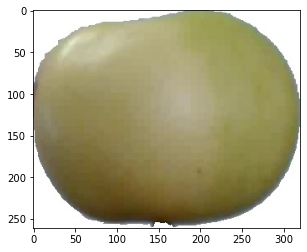

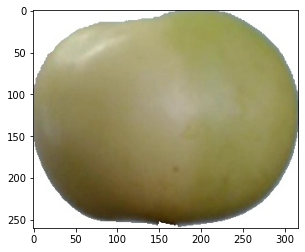

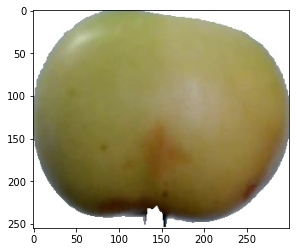

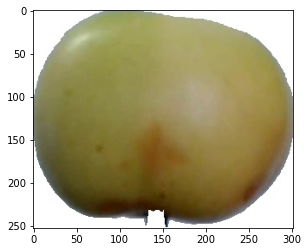

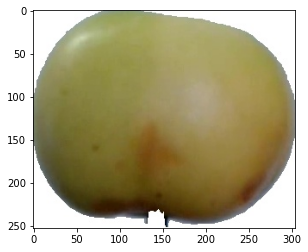

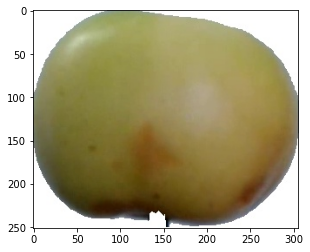

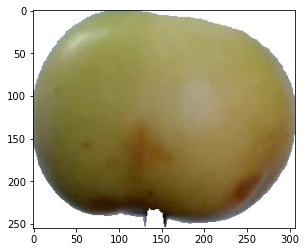

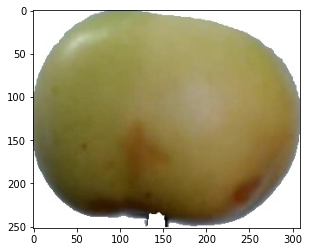

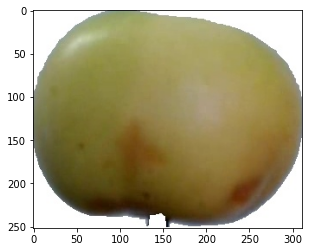

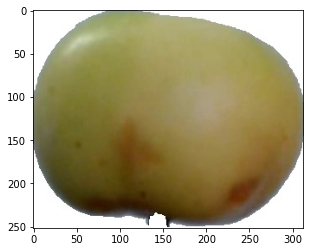

apple_braeburn_1:


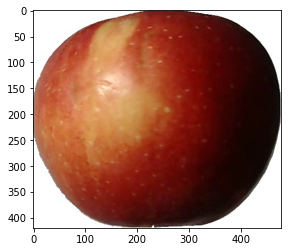

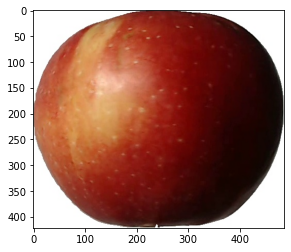

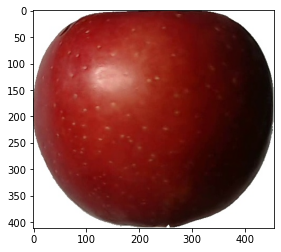

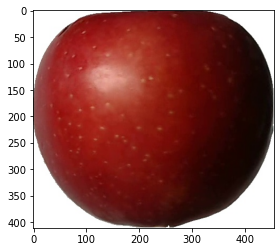

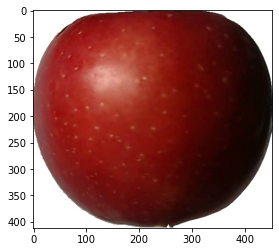

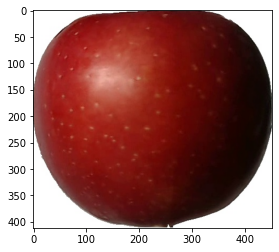

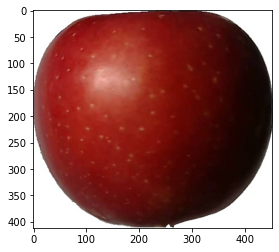

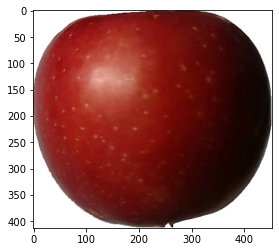

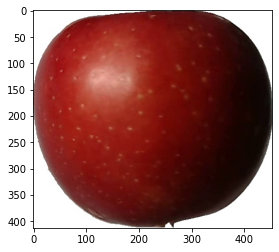

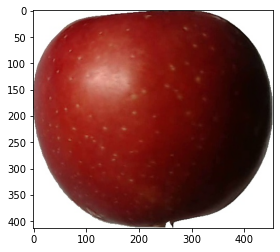

apple_crimson_snow_1:


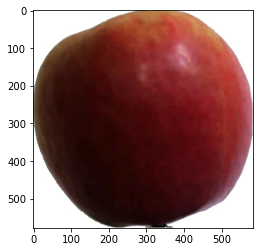

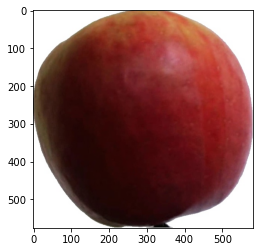

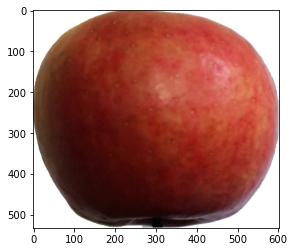

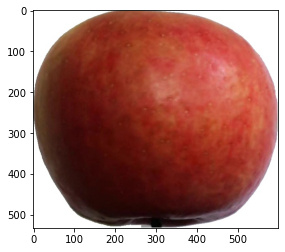

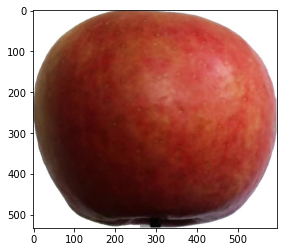

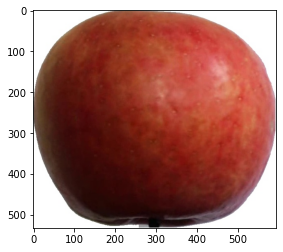

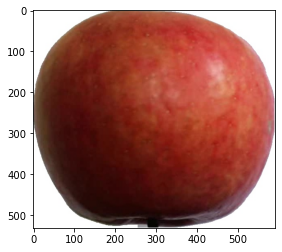

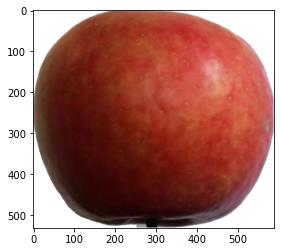

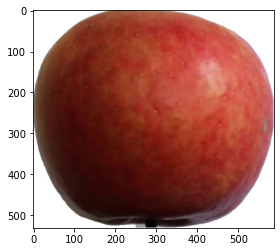

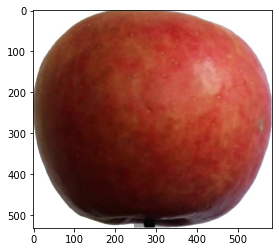

apple_golden_1:


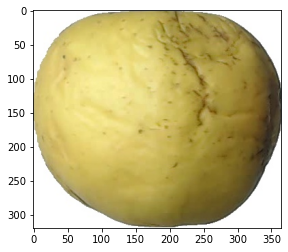

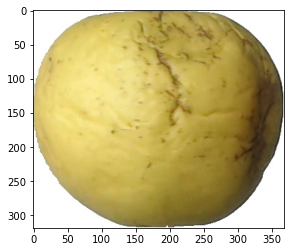

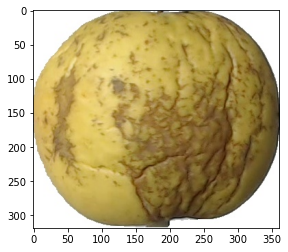

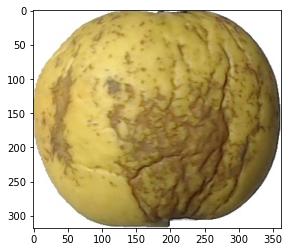

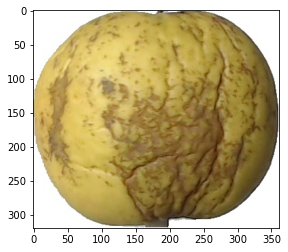

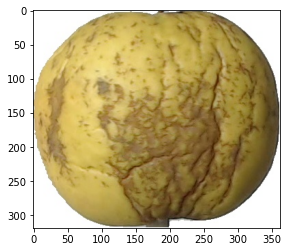

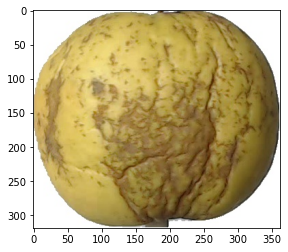

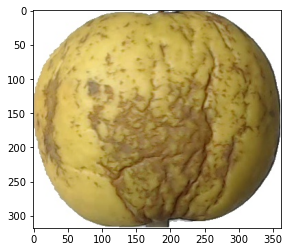

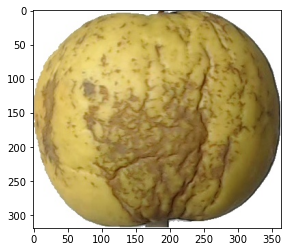

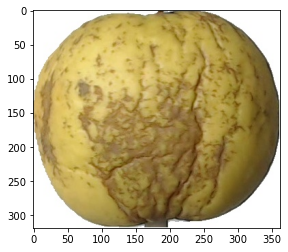

apple_golden_2:


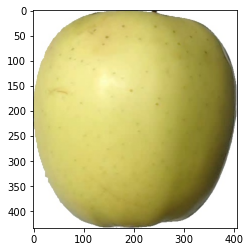

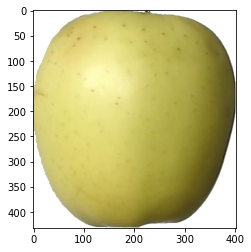

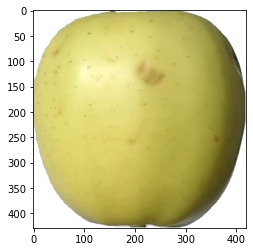

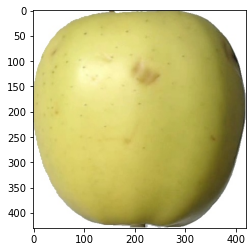

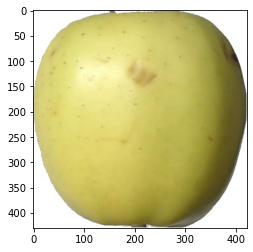

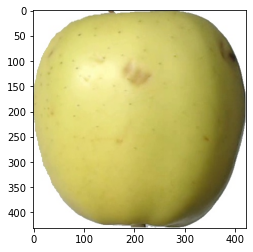

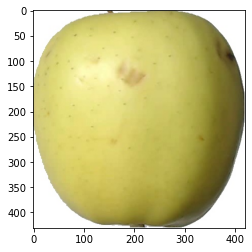

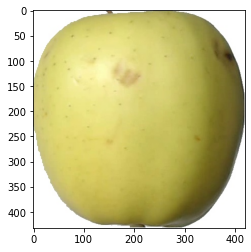

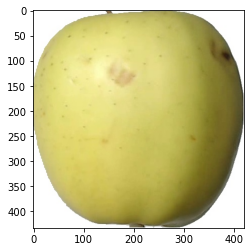

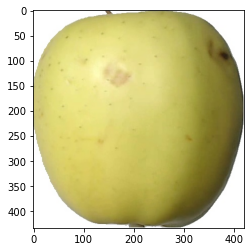

apple_golden_3:


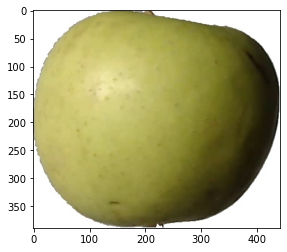

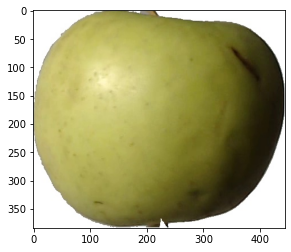

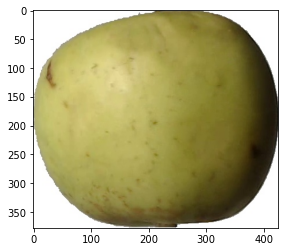

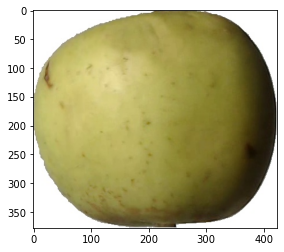

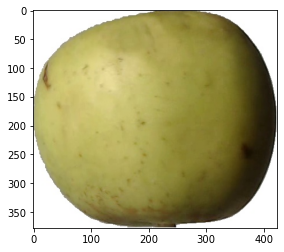

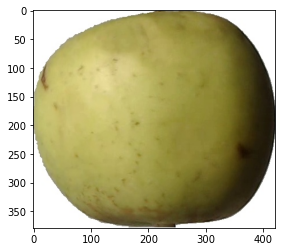

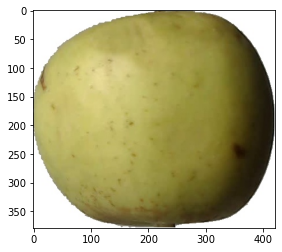

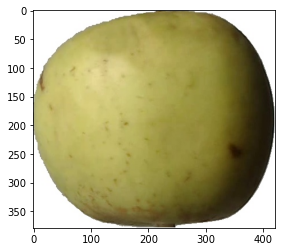

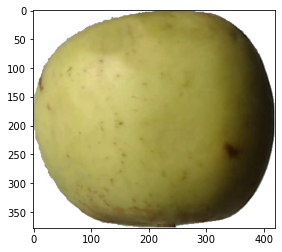

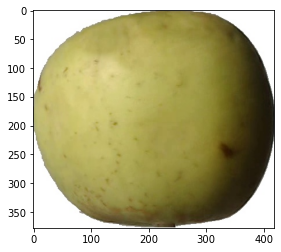

apple_granny_smith_1:


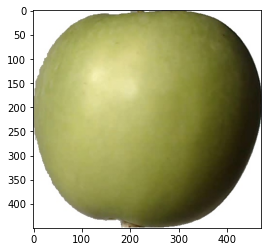

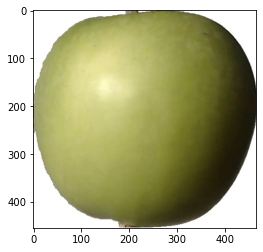

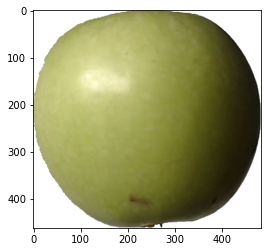

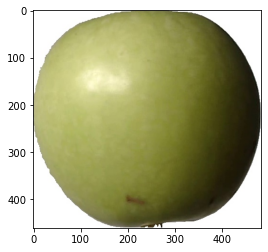

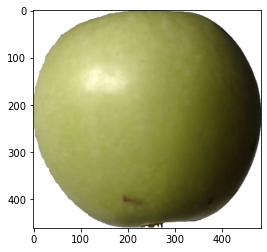

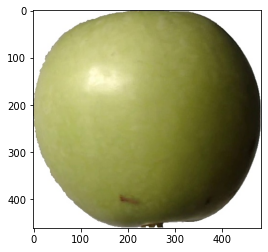

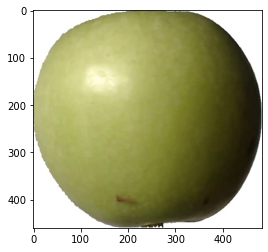

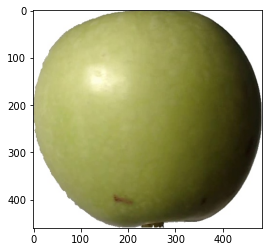

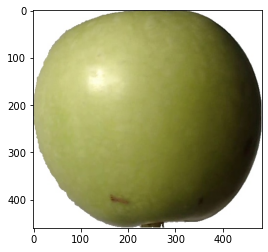

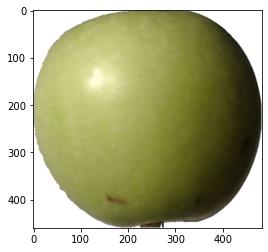

apple_hit_1:


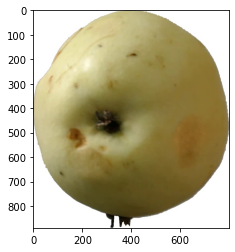

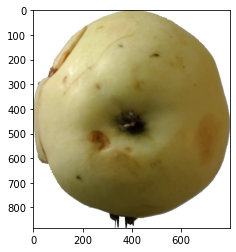

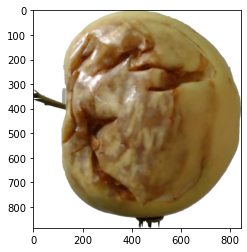

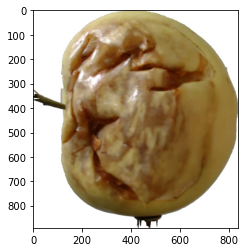

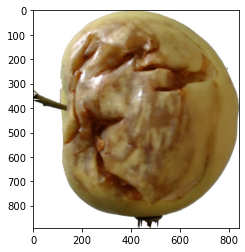

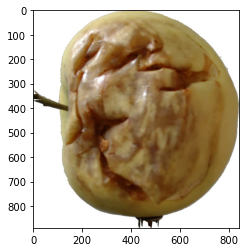

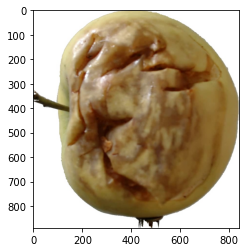

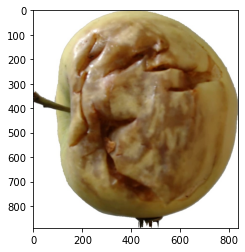

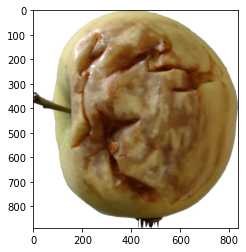

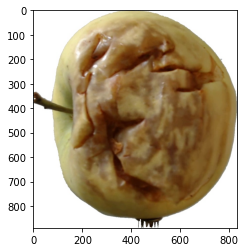

apple_pink_lady_1:


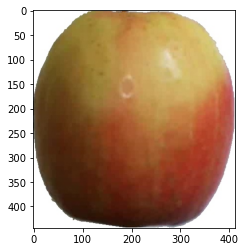

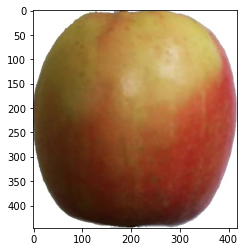

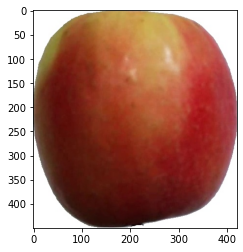

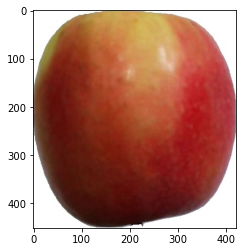

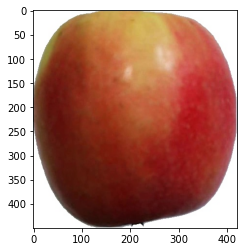

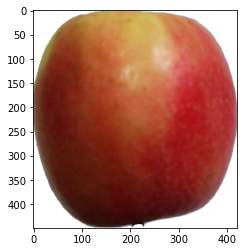

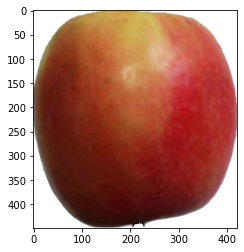

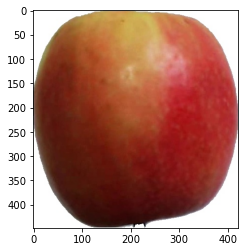

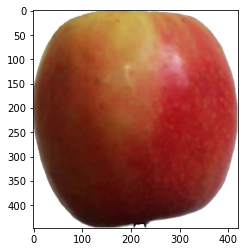

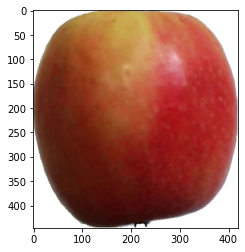

apple_red_1:


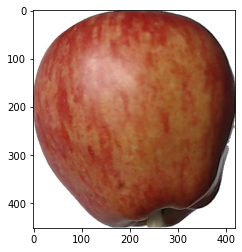

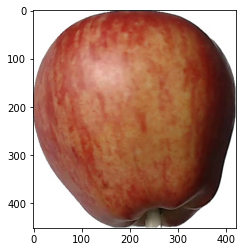

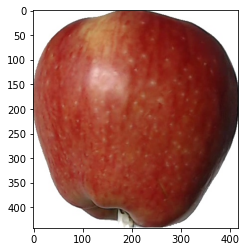

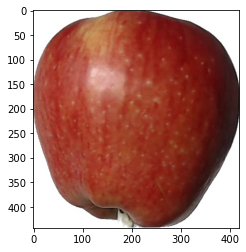

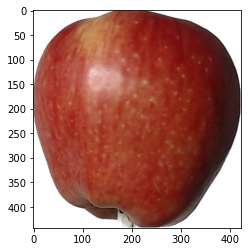

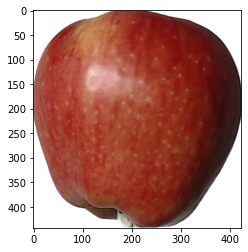

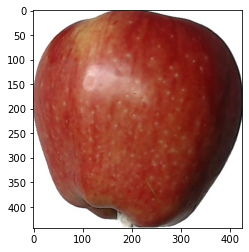

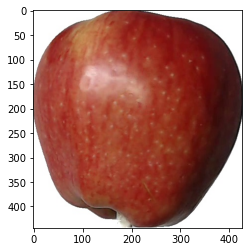

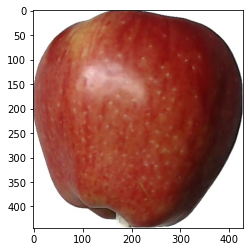

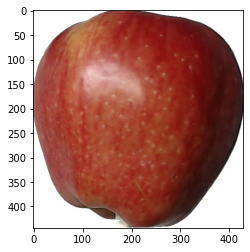

apple_red_2:


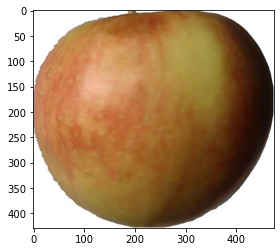

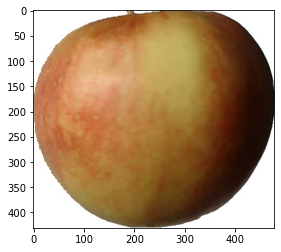

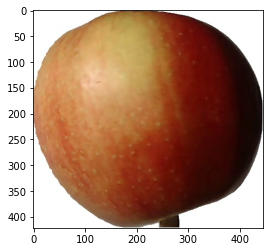

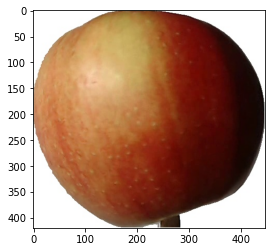

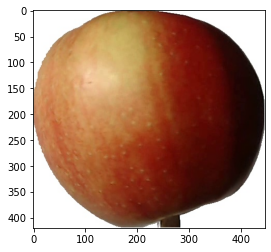

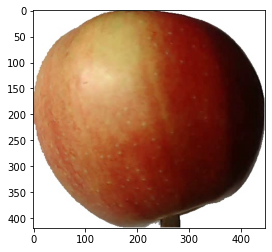

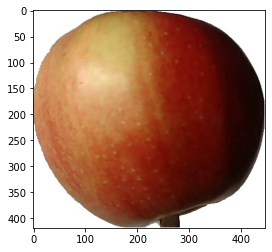

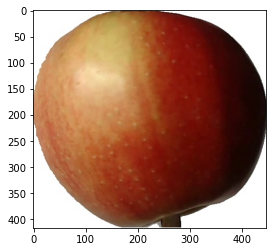

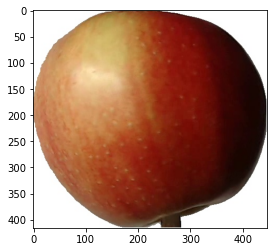

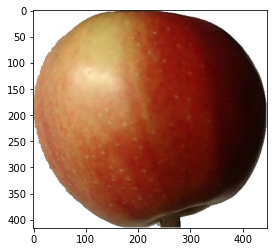

apple_red_3:


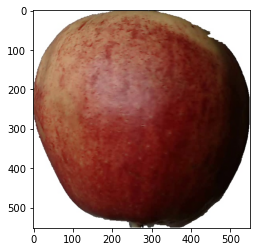

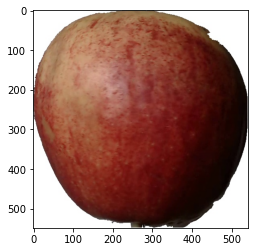

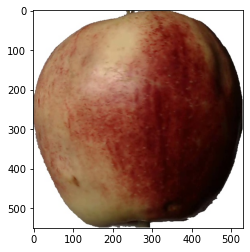

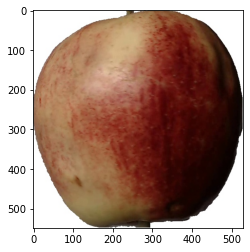

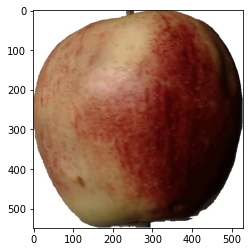

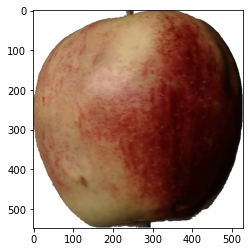

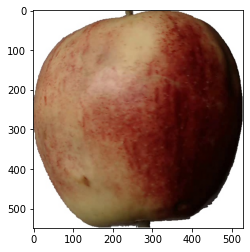

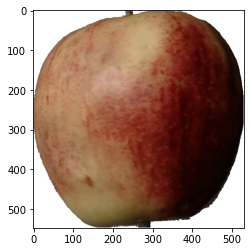

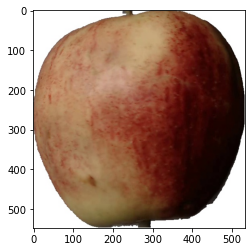

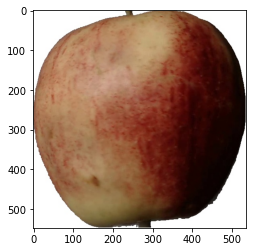

apple_red_delicios_1:


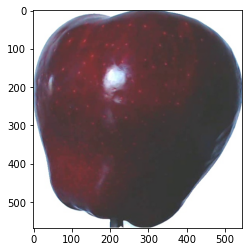

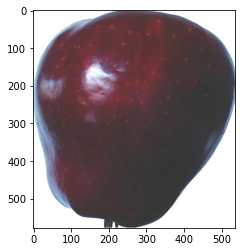

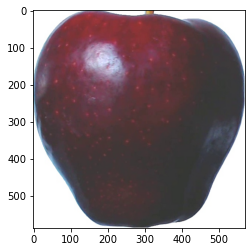

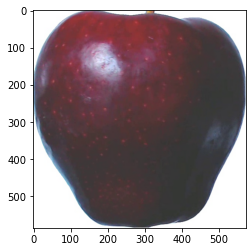

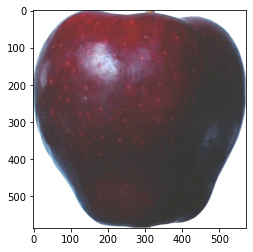

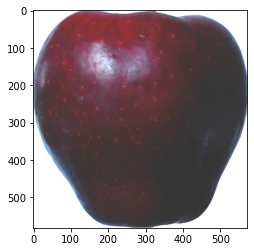

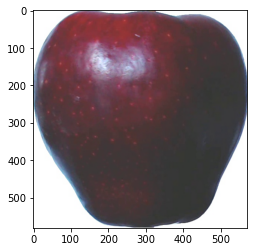

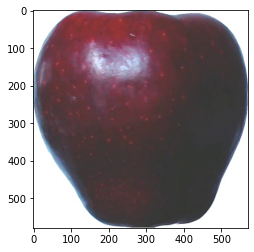

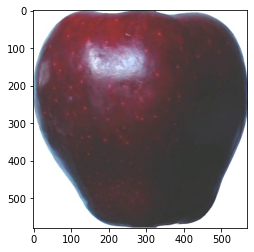

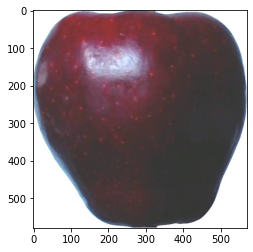

apple_red_yellow_1:


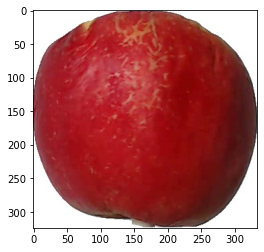

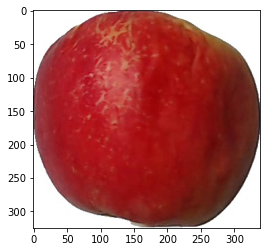

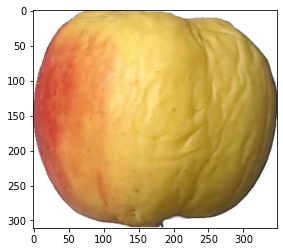

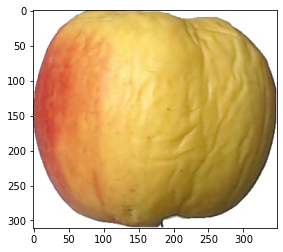

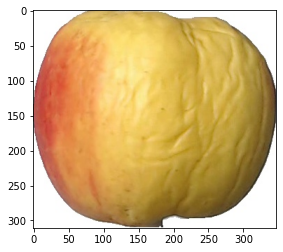

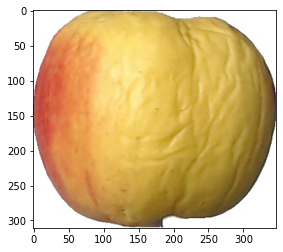

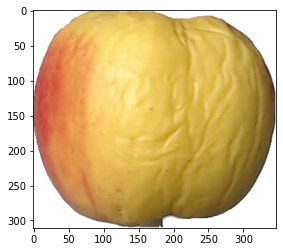

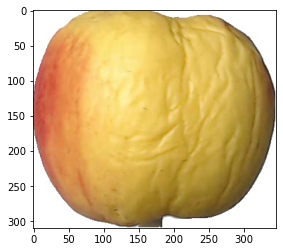

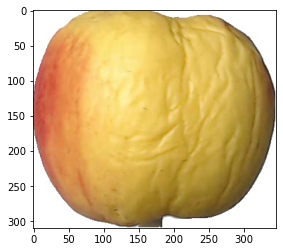

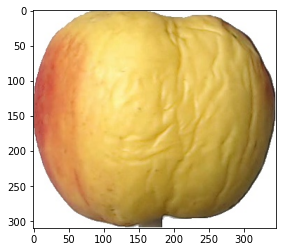

apple_rotten_1:


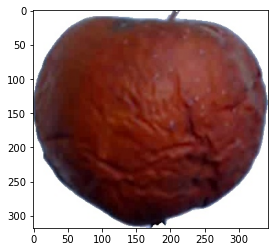

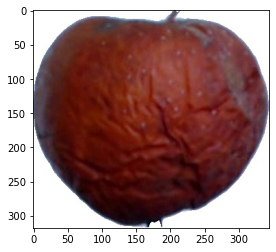

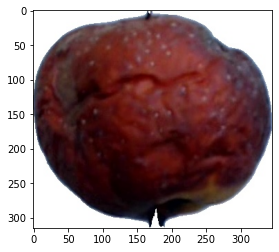

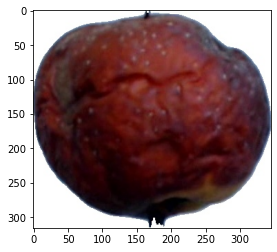

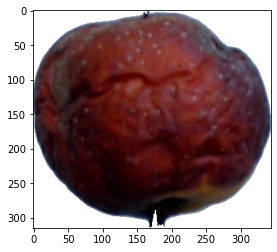

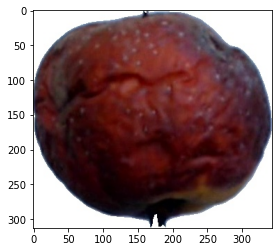

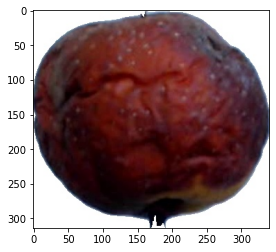

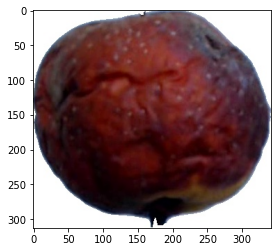

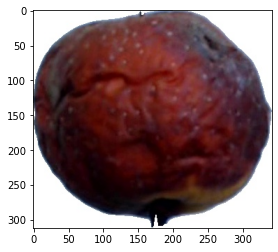

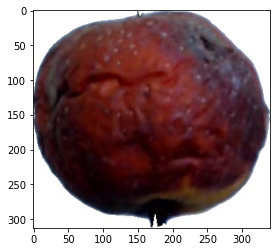

cabbage_white_1:


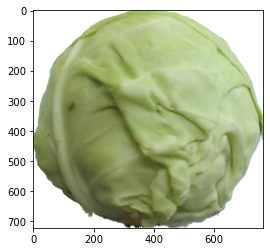

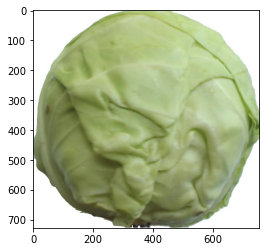

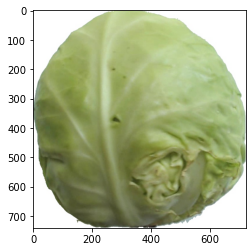

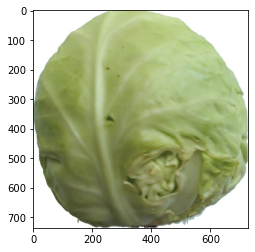

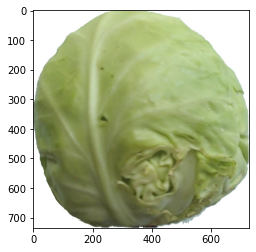

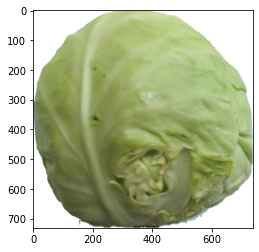

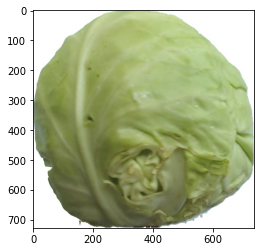

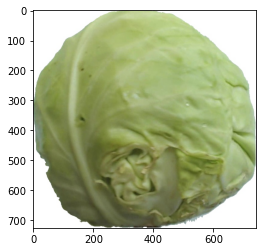

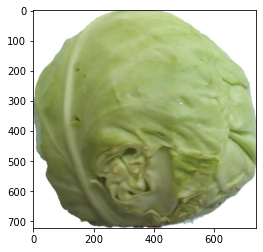

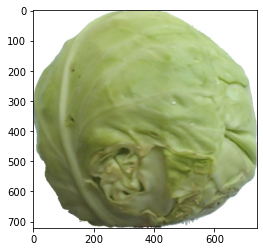

carrot_1:


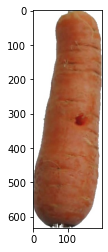

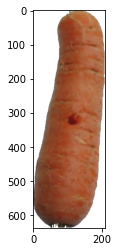

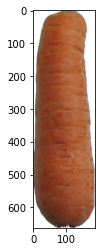

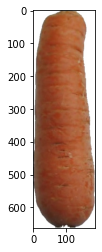

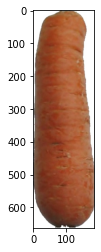

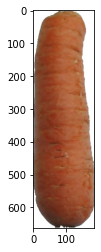

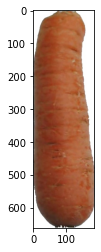

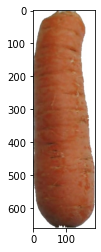

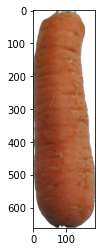

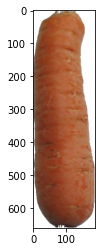

cucumber_1:


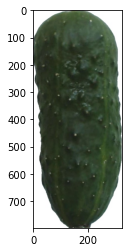

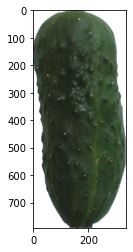

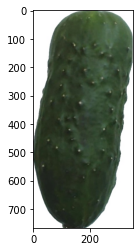

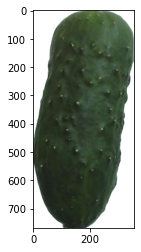

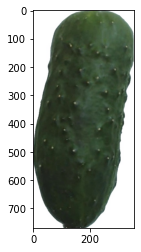

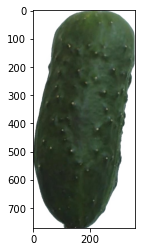

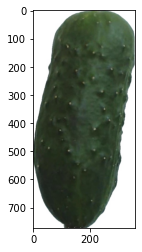

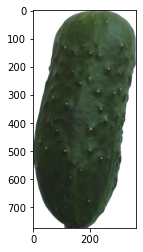

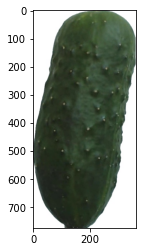

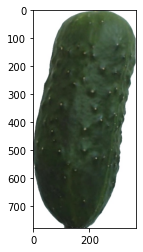

cucumber_3:


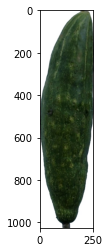

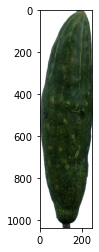

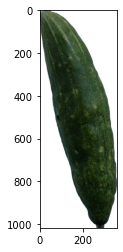

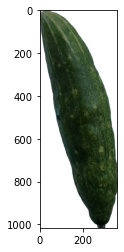

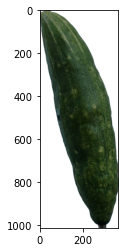

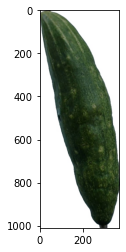

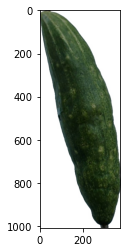

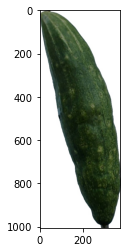

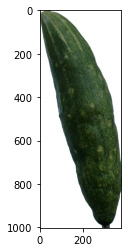

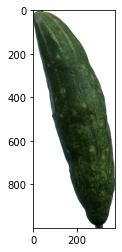

eggplant_violet_1:


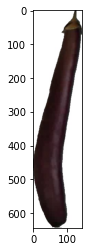

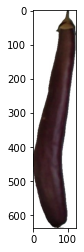

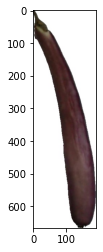

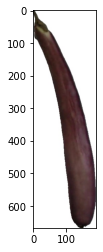

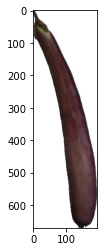

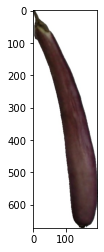

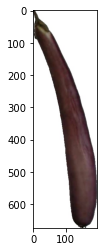

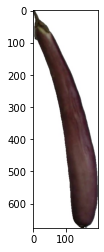

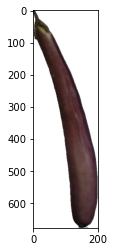

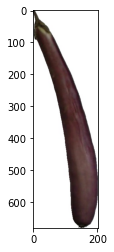

pear_1:


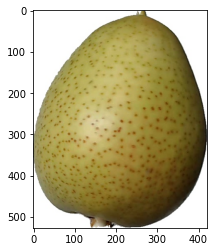

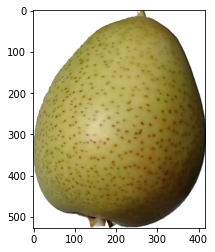

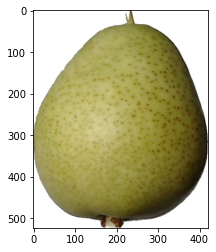

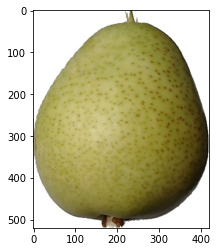

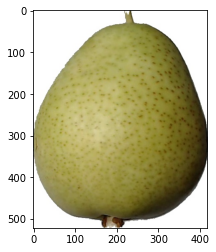

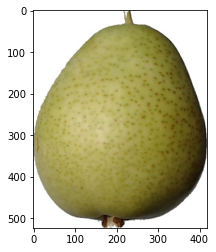

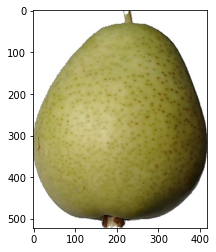

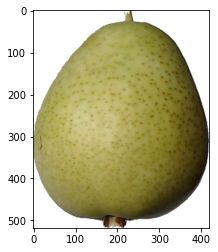

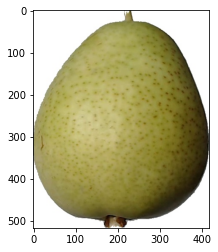

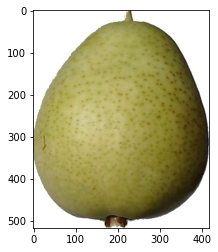

pear_3:


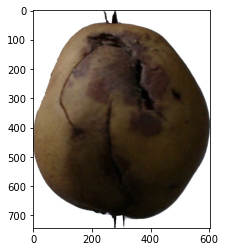

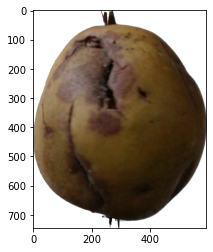

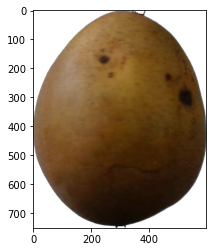

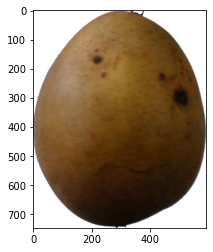

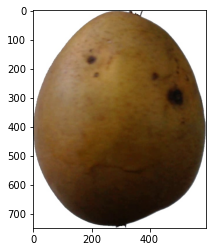

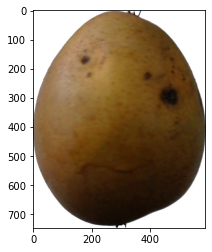

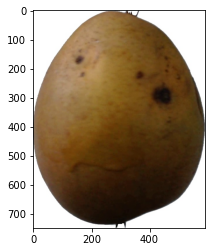

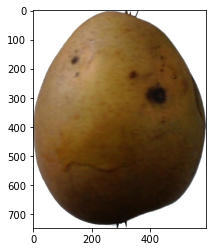

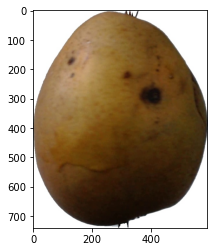

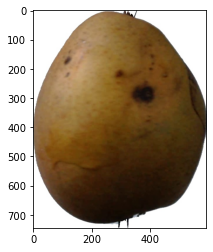

zucchini_1:


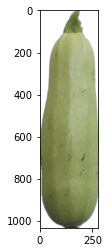

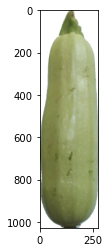

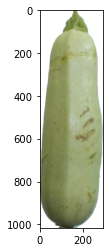

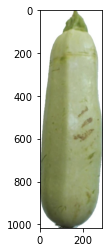

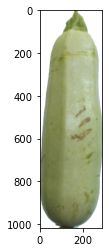

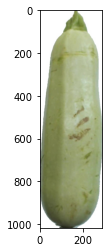

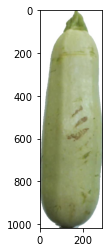

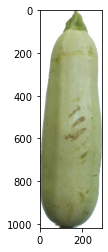

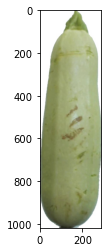

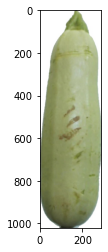

zucchini_dark_1:


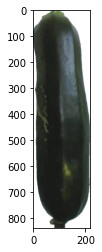

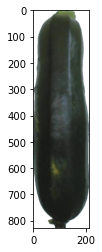

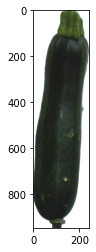

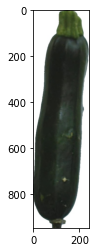

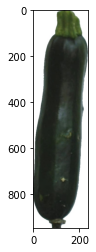

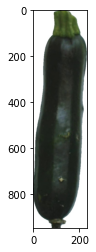

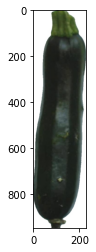

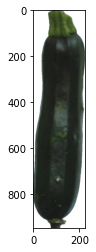

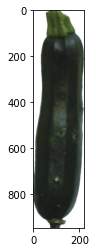

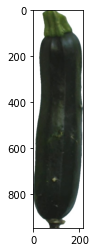

In [14]:
# Displays 10 first images per fruits

for fruits in fruits_df['Fruit'].unique():
    print('\033[1m' + fruits + ":")
    for image_path in fruits_df[fruits_df['Fruit'] == fruits][:10]['Image_path']:
        img = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(image_rgb, cmap='gray')
        plt.show()
plt.show();

<h1>Feature Extraction

In [15]:
X = fruits_df['Image_path'].copy()
y = LabelEncoder().fit_transform(fruits_df['Fruit'].copy())

In [16]:
images_resized_list = []

for loc, image_path in enumerate(X):
    
    image = cv2.imread(image_path)

    image_resized = cv2.resize(image, (224, 224))
    
    images_resized_list.append(image_resized)


images_resized_list = np.array(images_resized_list)

In [17]:
model = VGG16(weights="imagenet", include_top=False, pooling='max', input_shape=(224, 224, 3))

for layer in model.layers:
            layer.trainable = False

In [18]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [19]:
feature_matrix = model.predict(images_resized_list)

195/195 [==============================] - 874s 4s/step


In [20]:
feature_matrix.shape

(6231, 512)

<h1>Dimentionality Reduction

In [21]:
pca_99 = PCA(n_components=0.99).fit_transform(feature_matrix)

In [22]:
pca_99.shape

(6231, 373)

In [23]:
pca_90 = PCA(n_components=0.90).fit_transform(feature_matrix)

pca_90.shape

(6231, 137)

In [24]:
feature_matrix_std = StandardScaler().fit_transform(feature_matrix)

In [25]:
pca_86_std = PCA(n_components=0.90).fit_transform(feature_matrix_std)

pca_86_std.shape

(6231, 197)